## Analysis of optimal capacity per postal code aggregation

### Project Description

In this project the task is to define the optimal capaciy in trucks, which will cover most of the demand for defined regular customers. The ultimate benifit of the project is to reduce the number of unused trucked and flatten the demand curve as much as possible
The initial features in the provided dataset are as follows:<br>
**CCHBC Week**    financial/reporting week<br>   
**Calendar Week** calendar week<br>
**Year**          calendar year<br>
**Lockdown**      identification of corona measures<br>
**CPL Num**       customer planning level number<br> 
**CPL**           customer planning level<br> 
**Customer Num**  customer name<br> 
**Customer**      customer number<br> 
**City**          customer city<br> 
**Address**       customer postal code<br>
**PLZ ID**        aggregated postal codes<br>
**Region**        region<br> 
**Regularity**    identification if orders come regularly from this customer<br>
**VMI**           identification if vendor management inventory is in place<br> 
**UC**            number of unit cases (*target value*)

### Data Analysis

##### Upload of the data and needed libraries

In [1]:
import numpy as np
import pandas as pd

from matplotlib import pyplot as plt
import seaborn as sns
from pylab import rcParams
rcParams["figure.figsize"] = 5, 3
rcParams.update({"font.size": 14})
plt.style.use('fivethirtyeight')
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import warnings
warnings.filterwarnings('ignore')

In [2]:
DATASET_PATH = 'data_to_analyze_fake.csv'

In [3]:
X = pd.read_csv(DATASET_PATH)

In [4]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34331 entries, 0 to 34330
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CCHBC Week     34331 non-null  float64
 1   Calendar Week  34315 non-null  float64
 2   Year           34315 non-null  float64
 3   Lockdown       34315 non-null  float64
 4   CPL Num        34315 non-null  float64
 5   CPL            34315 non-null  object 
 6   Customer Num   34325 non-null  float64
 7   Customer       34315 non-null  object 
 8   City           34315 non-null  object 
 9   Address        34315 non-null  float64
 10  PLZ ID         34315 non-null  float64
 11  Region         34315 non-null  object 
 12  Regularity     34315 non-null  object 
 13  VMI            34315 non-null  object 
 14  UC             34325 non-null  float64
dtypes: float64(9), object(6)
memory usage: 3.9+ MB


##### Data preprocessing

In [5]:
X.isna().sum()

CCHBC Week        0
Calendar Week    16
Year             16
Lockdown         16
CPL Num          16
CPL              16
Customer Num      6
Customer         16
City             16
Address          16
PLZ ID           16
Region           16
Regularity       16
VMI              16
UC                6
dtype: int64

For simplicity the rows where data is not provided are ignored. Also the categorical features are translated into numerical values 

In [6]:
X.dropna(inplace=True)

In [7]:
X.drop(X[X['CPL Num']=='#'].index, axis=0,inplace=True)

In [8]:
X = X.astype({'CCHBC Week': 'object', 'Calendar Week': np.int16, 
              'CPL Num': np.float64, 'Customer Num': np.float64, 
              'Address': np.int16, 'PLZ ID': np.int16})

In [9]:
X['Regularity'] = X['Regularity'].replace({'Regular':1, 'Sporadic':0})
X['VMI'] = X['VMI'].replace({'Yes':1, 'No':0})

In [10]:
X['UC'] = X['UC']/1000

In [11]:
X['Week_num'] = 0
X.loc[(X['Year'] == 2019), 'Week_num'] = X['Calendar Week']
X.loc[(X['Year'] == 2020), 'Week_num'] = X['Calendar Week']+52
X.loc[(X['Year'] == 2021), 'Week_num'] = X['Calendar Week']+104
X.loc[(X['Year'] == 2022), 'Week_num'] = X['Calendar Week']+156

In [12]:
X_region = pd.get_dummies(X['Region'])

In [13]:
X = pd.concat([X,X_region],axis=1)

##### Data processing. Generation of new features

In order to analyze further, 2 main tasks are needed to be faced: <br>
1. To define the seasonality pattern. This will help to define optimal capacities for both low- and high-season<br>
2. To define the impact of corona measures on the demand. This will help to simulate values as there were no lockdowns at all to get more precise data to interpret in the future<br>
First we aggregate the volume per weeks and look at the patterns. To define where is the beginning and end of high season, moving averages of 4 and 8 weeks will be compared

In [14]:
X_weeks = pd.pivot_table(X, values='UC', index=['Year', 'Calendar Week', 'Lockdown'], aggfunc=np.sum)
X_weeks = X_weeks.rename_axis(None, axis=1).reset_index()

In [15]:
X_weeks['SMA4'] = X_weeks['UC'].rolling(4).mean()
X_weeks['SMA8'] = X_weeks['UC'].rolling(8).mean()
X_weeks

,Year,Calendar Week,Lockdown,UC,SMA4,SMA8
0,2019.0,1,0.0,864.727,NaN,NaN
1,2019.0,2,0.0,1443.543,NaN,NaN
2,2019.0,3,0.0,1026.024,NaN,NaN
3,2019.0,4,0.0,1188.179,1130.61825,NaN
4,2019.0,5,0.0,980.663,1159.60225,NaN
...,...,...,...,...,...,...
177,2022.0,22,0.0,1753.514,1601.52500,1571.940500
178,2022.0,23,0.0,1469.806,1561.28325,1569.579500
179,2022.0,24,0.0,1453.354,1522.16600,1577.318625
180,2022.0,25,0.0,1904.149,1645.20575,1620.635875


Defining the start-end weeks of different corona measures

In [16]:
Duration_lockdown4 = list(X_weeks[(X_weeks["Lockdown"]==10)&((X_weeks["Lockdown"].shift(1)!=10) | (X_weeks["Lockdown"].shift(-1)!=10))].index)
Duration_lockdown4

[63, 66, 98, 100, 103, 106]

In [17]:
Duration_lockdown3 = list(X_weeks[(X_weeks["Lockdown"]==8)&((X_weeks["Lockdown"].shift(1)!=8) | (X_weeks["Lockdown"].shift(-1)!=8))].index)
Duration_lockdown3

[95, 97, 107, 108, 116, 119, 150, 152]

In [18]:
Duration_lockdown2 = list(X_weeks[(X_weeks["Lockdown"]==6)&((X_weeks["Lockdown"].shift(1)!=6) | (X_weeks["Lockdown"].shift(-1)!=6))].index)
Duration_lockdown2

[67, 71, 101, 102, 109, 115, 120, 123, 143, 149, 153, 159]

In [19]:
Duration_lockdown1 = list(X_weeks[(X_weeks["Lockdown"]==1)&((X_weeks["Lockdown"].shift(1)!=1) | (X_weeks["Lockdown"].shift(-1)!=1))].index)
Duration_lockdown1

[72, 94, 124, 142, 160, 164]

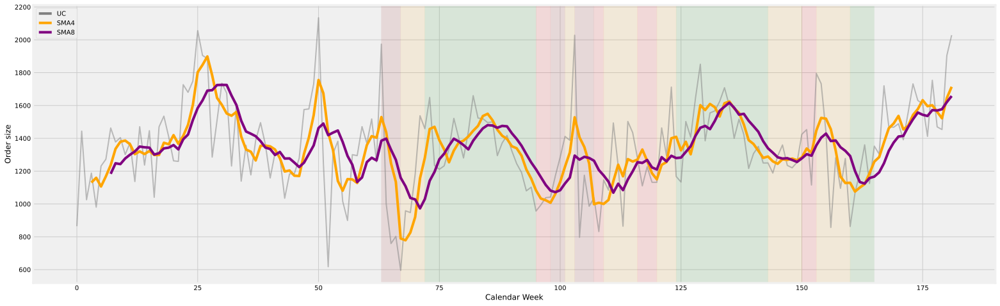

In [20]:
ax = X_weeks[['UC', 'SMA4', 'SMA8']].plot(kind='line', figsize=(24,8), 
                                          color = ['gray','orange','purple'], 
                                          xlabel='Calendar Week', ylabel='Order size')

ax.lines[0].set_color('gray')
ax.lines[0].set_linewidth(2)
ax.lines[0].set_alpha(0.5)

for i in range(len(Duration_lockdown4))[::2]:
    ax.axvspan(Duration_lockdown4[i], Duration_lockdown4[i+1]+1, 
           label="Hard Lockdown",color="darkred", alpha=0.1)

for i in range(len(Duration_lockdown3))[::2]:
    ax.axvspan(Duration_lockdown3[i], Duration_lockdown3[i+1]+1, 
           label="Light Lockdown",color="red", alpha=0.1)

for i in range(len(Duration_lockdown2))[::2]:
    ax.axvspan(Duration_lockdown2[i], Duration_lockdown2[i+1]+1, 
           label="Strict Measures",color="orange", alpha=0.1)

for i in range(len(Duration_lockdown1))[::2]:
    ax.axvspan(Duration_lockdown1[i], Duration_lockdown1[i+1]+1, 
           label="Light Measures",color="green", alpha=0.1)

To define the exact start and end of high-season, the interceptions of MA4 and MA8 are marked. When MA4 move higher than MA8 - the volume significantly increases meaning the demand spikes. When MA8 move higher than MA4 - the volume significantly decreases meaning the demand slows down 

In [21]:
hs_start = X_weeks[(X_weeks['SMA8']<X_weeks['SMA4']) & (X_weeks['SMA8'].shift(1)>X_weeks['SMA4'].shift(1))]
hs_end = X_weeks[(X_weeks['SMA8']>X_weeks['SMA4']) & (X_weeks['SMA8'].shift(1)<X_weeks['SMA4'].shift(1))]

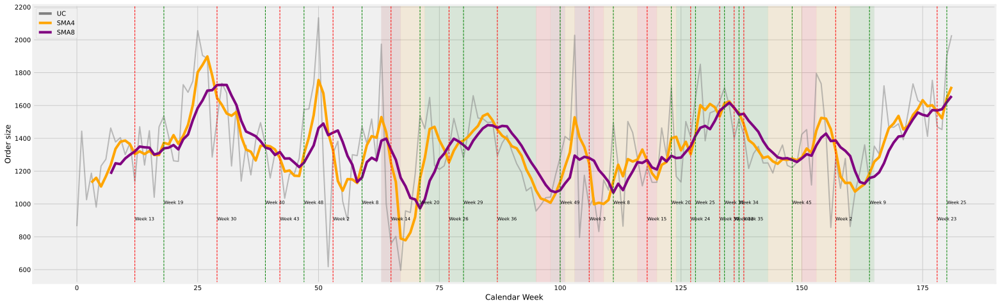

In [22]:
ax = X_weeks[['UC', 'SMA4', 'SMA8']].plot(kind='line', figsize=(24,8), 
                                          color = ['gray','orange','purple'], 
                                          xlabel='Calendar Week', ylabel='Order size')

ax.lines[0].set_color('gray')
ax.lines[0].set_linewidth(2)
ax.lines[0].set_alpha(0.5)

for i in range(len(Duration_lockdown4))[::2]:
    ax.axvspan(Duration_lockdown4[i], Duration_lockdown4[i+1]+1, 
           label="Hard Lockdown",color="darkred", alpha=0.1)

for i in range(len(Duration_lockdown3))[::2]:
    ax.axvspan(Duration_lockdown3[i], Duration_lockdown3[i+1]+1, 
           label="Light Lockdown",color="red", alpha=0.1)

for i in range(len(Duration_lockdown2))[::2]:
    ax.axvspan(Duration_lockdown2[i], Duration_lockdown2[i+1]+1, 
           label="Strict Measures",color="orange", alpha=0.1)

for i in range(len(Duration_lockdown1))[::2]:
    ax.axvspan(Duration_lockdown1[i], Duration_lockdown1[i+1]+1, 
           label="Light Measures",color="green", alpha=0.1)

for xi in (hs_start.index):
    plt.axvline(x=xi, color='green', linestyle='--', linewidth = 1)
    ax.text(xi, 1000, f'Week {hs_start["Calendar Week"][xi]}', size=7)
    
for xj in (hs_end.index):
    plt.axvline(x=xj, color='red', linestyle='--', linewidth = 1)
    ax.text(xj, 900, f'Week {hs_end["Calendar Week"][xj]}', size=7)


High season is defined from week 19 till week 35 and from week 45 till week 1

Easter season is defined from 8 till week 15

In [23]:
condition_easter = ((X['Calendar Week'] >= 8) & (X['Calendar Week'] < 15))
condition_hs = (((X['Calendar Week'] >= 19) & (X['Calendar Week'] < 35)) | 
             ((X['Calendar Week'] >= 45) & (X['Calendar Week'] < 1)))

In [24]:
X['High_season'] = 0
X.loc[condition_easter, 'High_season'] = 1
X.loc[condition_hs, 'High_season'] = 2

In [25]:
X.head(5)

,CCHBC Week,Calendar Week,Year,Lockdown,CPL Num,CPL,Customer Num,Customer,City,Address,...,UC,Week_num,Kaernten,Nahbereich,OOE,SBG,Stmk,Tirol,VBG,High_season
0,1.2021,1,2021.0,10.0,120100.0,Rewe,1.196647e+09,REWE INTERN. LAGER & TRANSPORT GMBH,KALSDORF,8401,...,7.985,105,0,0,0,0,1,0,0,0
1,1.2021,1,2021.0,10.0,120100.0,Rewe,1.154458e+09,REWE INTERN. LAGER & TRANSPORT GMBH,STAMS,6422,...,9.343,105,0,0,0,0,0,1,0,0
2,1.2021,1,2021.0,10.0,120100.0,Rewe,1.172204e+09,REWE SD-LAGER ST. POELTEN,ST. POELTEN,3100,...,17.720,105,0,1,0,0,0,0,0,0
3,1.2021,1,2021.0,10.0,120100.0,Rewe,1.146866e+09,REWE INTERN. LAGER & TRANSPORT GMBH,WIENER NEUDORF,2355,...,100.368,105,0,1,0,0,0,0,0,0
4,1.2021,1,2021.0,10.0,120100.0,Rewe,1.123773e+09,CROSS DOCKING LAGER OST,WIENER NEUDORF,2355,...,0.636,105,0,1,0,0,0,0,0,0


Coming to the second task, the impact of the corona measures on the weekly volumes is indeed significant, considering the correlation with target value

In [26]:
X_weeks_exp = pd.pivot_table(X, values='UC', 
                         index=['Year', 'Calendar Week', 'Lockdown', 'High_season'],
                         aggfunc=np.sum)
X_weeks_exp = X_weeks_exp.rename_axis(None, axis=1).reset_index()

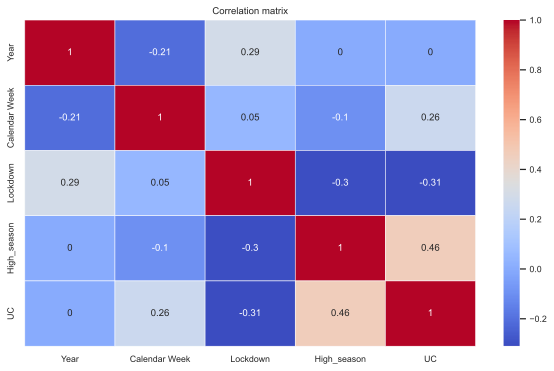

In [27]:
plt.figure(figsize=(9, 6))

sns.set(font_scale=0.8)

corr_matrix = X_weeks_exp.corr()
corr_matrix = np.round(corr_matrix, 2)
corr_matrix[np.abs(corr_matrix) < 0.05] = 0

sns.heatmap(corr_matrix, annot=True, linewidths=.5, cmap='coolwarm')

plt.title('Correlation matrix')
plt.show()

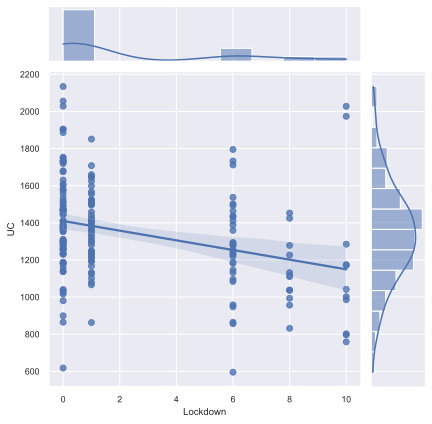

In [28]:
grid = sns.jointplot(X_weeks_exp['Lockdown'], X_weeks_exp['UC'], kind='reg')
grid.fig.set_figwidth(6)
grid.fig.set_figheight(6)

plt.show()

In order to get rid of the impact of corona measures, the dataset should be described with precise model, then this model should be re-applied to the same dataset, but with feature Lockdown=0

### Model Creation

##### Scaling the datasets

In [29]:
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score as r2
from scipy import stats

In [30]:
def evaluate_preds(train_true_values, train_pred_values, test_true_values, test_pred_values):
    print("Train R2:\t" + str(round(r2(train_true_values, train_pred_values), 3)))
    print("Test R2:\t" + str(round(r2(test_true_values, test_pred_values), 3)))
    
    plt.figure(figsize=(12,6))
    
    plt.subplot(121)
    sns.scatterplot(x=train_pred_values, y=train_true_values)
    plt.plot([0, 250], [0, 250], linestyle='--', color='black')  # диагональ, где true_values = pred_values
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('Train sample prediction')
    
    plt.subplot(122)
    sns.scatterplot(x=test_pred_values, y=test_true_values)
    plt.plot([0, 250], [0, 250], linestyle='--', color='black')  # диагональ, где true_values = pred_values
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('Test sample prediction')

    plt.show()

In [31]:
X_train = X.copy()

As it can be seen from the trend, the first corona measures has impacted significantly the demand curve, as the panic has spread among the consumers. In order the model does not consider this heavy changes, we replace the volume during the first lockdown with the average demand from 2019

In [32]:
Duration_lockdown4, Duration_lockdown2

([63, 66, 98, 100, 103, 106],
 [67, 71, 101, 102, 109, 115, 120, 123, 143, 149, 153, 159])

In [33]:
X_weeks['UC'][63:71].mean()

1027.560875

In [34]:
X_weeks['UC'][63-52:71-52].mean()

1338.605125

In [35]:
inc = X_weeks['UC'][63-52:71-52].mean()/X_weeks['UC'][63:71].mean()
inc

1.3027015309433616

In [36]:
X_train.loc[(X_train['Week_num']>=63)&(X_train['Week_num']<=71), 'UC'] = \
            X_train.loc[(X_train['Week_num']>=63)&(X_train['Week_num']<=71), 'UC']*inc

Separating target value from features

In [37]:
y_train = X_train['UC']
X_train.drop('UC', axis=1, inplace = True)
X_test = X_train.copy()

In [38]:
X_test['Lockdown'] = 0

In [39]:
feature_names_for_stand = X_train.select_dtypes(include=['float64', 'int8','int16', 'int64','uint8']).columns.tolist()

feature_names_for_stand

['Calendar Week',
 'Year',
 'Lockdown',
 'CPL Num',
 'Customer Num',
 'Address',
 'PLZ ID',
 'Regularity',
 'VMI',
 'Week_num',
 'Kaernten',
 'Nahbereich',
 'OOE',
 'SBG',
 'Stmk',
 'Tirol',
 'VBG',
 'High_season']

In [40]:
scaler = StandardScaler()

stand_features = scaler.fit_transform(X_train[feature_names_for_stand])
stand_features_test = scaler.transform(X_test[feature_names_for_stand])

In [41]:
X_train[feature_names_for_stand] = stand_features
X_test[feature_names_for_stand] = stand_features_test

In [42]:
object_features = X_train.select_dtypes('object').columns.tolist()

object_features

['CCHBC Week', 'CPL', 'Customer', 'City', 'Region']

In [43]:
X_train.drop(columns=object_features, inplace=True)
X_test.drop(columns=object_features, inplace=True)

Applying the random forest model to describe the datasets and simulate the alues wihout corona measures

In [44]:
rf = RandomForestRegressor(random_state=21, criterion='mse')
rf.fit(X_train, y_train)

y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

evaluate_preds(y_train, y_train_pred, y_train, y_test_pred)

Train R2:	0.937
Test R2:	0.899


In [45]:
abs(y_train - y_train_pred).mean()

1.3455741817177715

On average the difference between the model-generated values and true values is around 1k UC per order

In [46]:
X_reworked = X.copy()

In [47]:
new_UC = pd.DataFrame(pd.Series(y_test_pred),columns=['UC'])
new_UC

,UC
0,13.224470
1,7.327266
2,11.662280
3,50.379650
4,5.442298
...,...
34310,3.013130
34311,9.308350
34312,1.205690
34313,3.263780


In [48]:
X_reworked['Lockdown'] = 0
X_reworked.drop('UC', axis=1, inplace = True)
X_reworked.reset_index(inplace=True)
X_reworked = pd.concat([X_reworked,new_UC],axis=1)

In [49]:
X_weeks_reworked = pd.pivot_table(X_reworked, values='UC', 
                                  index=['Year', 'Calendar Week', 'Lockdown', 'High_season'], 
                                  aggfunc=np.sum)
X_weeks_reworked = X_weeks_reworked.rename_axis(None, axis=1).reset_index()

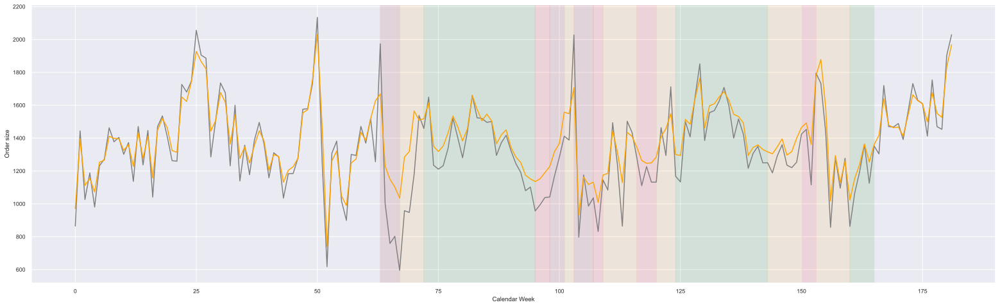

In [50]:
ax = X_weeks['UC'].plot(kind='line', figsize=(24,8), 
                                          color = ['gray'], 
                                          xlabel='Calendar Week', ylabel='Order size')
axx = X_weeks_reworked['UC'].plot(kind='line', figsize=(24,8), 
                                          color = ['orange'], 
                                          xlabel='Calendar Week', ylabel='Order size')

for i in range(len(Duration_lockdown4))[::2]:
    ax.axvspan(Duration_lockdown4[i], Duration_lockdown4[i+1]+1, 
           label="Hard Lockdown",color="darkred", alpha=0.1)

for i in range(len(Duration_lockdown3))[::2]:
    ax.axvspan(Duration_lockdown3[i], Duration_lockdown3[i+1]+1, 
           label="Light Lockdown",color="red", alpha=0.1)

for i in range(len(Duration_lockdown2))[::2]:
    ax.axvspan(Duration_lockdown2[i], Duration_lockdown2[i+1]+1, 
           label="Strict Measures",color="orange", alpha=0.1)

for i in range(len(Duration_lockdown1))[::2]:
    ax.axvspan(Duration_lockdown1[i], Duration_lockdown1[i+1]+1, 
           label="Light Measures",color="green", alpha=0.1)


In [51]:
(X_reworked.loc[X_reworked['Year']==2020,'UC'].sum() - X.loc[X['Year']==2020,'UC'].sum())

4575.195319780338

In [52]:
(X_reworked.loc[X_reworked['Year']==2021,'UC'].sum() - X.loc[X['Year']==2021,'UC'].sum())

3413.066677462979

The new dataset without corona measures consider the volume increase of 5.3 mln UC in 2020 and 2.7 mln UC in 2021 in 2021. 

### Defining optimal orders

##### Aggregating the new volumes per postal codes

In [53]:
X_aggreg_lowseason = pd.pivot_table(X_reworked.loc[(X_reworked['Regularity']==1) & (X_reworked['High_season']==0)], 
                          values='UC', 
                          index='Week_num',
                          columns = ['PLZ ID'],
                          aggfunc=np.sum)

In [54]:
X_aggreg_lowseason = X_aggreg_lowseason.fillna(X_aggreg_lowseason.mean())

Text(0, 0.5, 'Frequency')

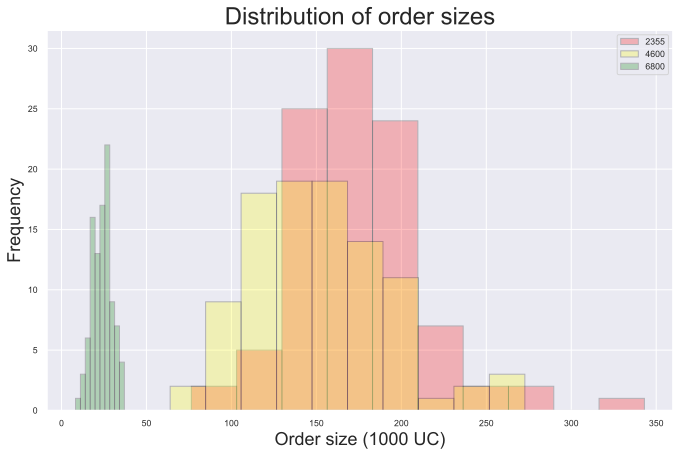

In [55]:
X_aggreg_lowseason[2355].plot(kind='hist', 
                color='red', edgecolor='black', alpha=0.25, figsize=(10, 7))
X_aggreg_lowseason[4600].plot(kind='hist', 
                color='yellow', edgecolor='black', alpha=0.25, figsize=(10, 7))
X_aggreg_lowseason[6800].plot(kind='hist', 
                color='green', edgecolor='black', alpha=0.25, figsize=(10, 7))

plt.legend({'2355': 'red', '4600': 'yellow', '6800': 'green'})    
plt.title('Distribution of order sizes', size=24)
plt.xlabel('Order size (1000 UC)', size=18)
plt.ylabel('Frequency', size=18)


As it can be seen from the comparison graph with different postal codes, the order sizes are normally distributed. Therefore for each postal code the value equal to 25% of distribution is defined

In [56]:
coverage = 0.25
optimal_order_ls = stats.norm.ppf(coverage,X_aggreg_lowseason.mean(),X_aggreg_lowseason.std())
optimal_order_ls

array([  6.66144241,   7.94484918,  18.23976545,  40.88873294,
         3.98110223,  31.87971581, 147.92187755,  31.2565754 ,
        18.62035655,  16.44487346,   3.8166853 ,  84.10678084,
         7.34951892,   5.07393252,   2.32034414,  23.83949666,
        14.42878985, 123.95133935,   5.09681216,  14.09919414,
         1.13955896,  16.93093679,   2.14791736,  18.66220748,
        36.15735799,  26.39748056,   5.00149622,  20.10490964,
         3.49296493,  60.18559552,   7.86606508,   1.16653435,
        29.11610727,   5.57184534,  15.18415497,  13.90981235,
         0.73380428,   3.72200761,   7.57181683])

In [57]:
X_result = pd.concat([pd.Series(X_aggreg_lowseason.columns).rename('PLZ ID'),
           pd.Series(optimal_order_ls).rename('Low_season')], axis=1)
X_result.set_index('PLZ ID', inplace = True)
X_result.head()

,Low_season
PLZ ID,
1000,6.661442
1230,7.944849
2000,18.239765
2100,40.888733
2200,3.981102


In [58]:
X_aggreg_highseason = pd.pivot_table(X_reworked.loc[(X_reworked['Regularity']==1) & (X_reworked['High_season']==2)], 
                          values='UC', 
                          index=['Week_num'],
                          columns = ['PLZ ID'],
                          aggfunc=np.sum)

In [59]:
X_aggreg_highseason = X_aggreg_highseason.fillna(X_aggreg_highseason.mean())

Text(0, 0.5, 'Frequency')

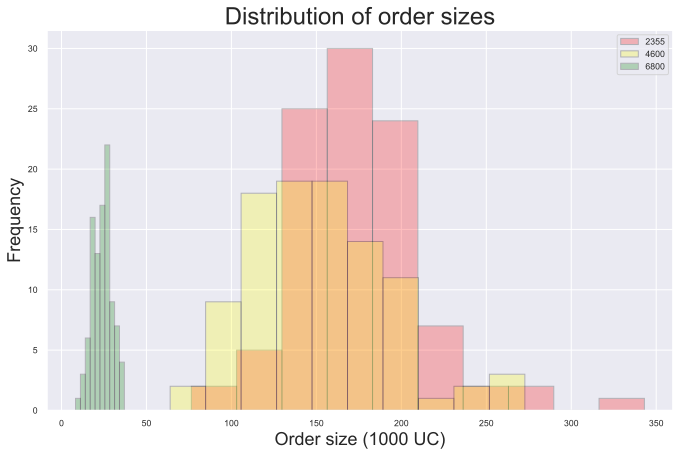

In [60]:
X_aggreg_lowseason[2355].plot(kind='hist', 
                color='red', edgecolor='black', alpha=0.25, figsize=(10, 7))
X_aggreg_lowseason[4600].plot(kind='hist', 
                color='yellow', edgecolor='black', alpha=0.25, figsize=(10, 7))
X_aggreg_lowseason[6800].plot(kind='hist', 
                color='green', edgecolor='black', alpha=0.25, figsize=(10, 7))

plt.legend({'2355': 'red', '4600': 'yellow', '6800': 'green'})
plt.title('Distribution of order sizes', size=24)
plt.xlabel('Order size (1000 UC)', size=18)
plt.ylabel('Frequency', size=18)

In [61]:
coverage = 0.25
optimal_order_hs = stats.norm.ppf(coverage,X_aggreg_highseason.mean(),X_aggreg_highseason.std())
optimal_order_hs

array([  8.3212395 ,  13.19111258,  19.26829272,  55.6082359 ,
         4.72594498,  41.23439706, 165.17997608,  38.49150303,
        18.0524744 ,  24.23580825,   4.60888811, 104.97632717,
        10.14418417,   7.18502951,   2.79968637,  30.2257998 ,
        15.99415273, 153.7254094 ,   6.53516173,  15.54381739,
         1.14930431,  19.10685728,   2.40085093,  24.77631395,
        42.23811098,  30.02284368,   4.21090389,  23.60222515,
         4.22824167,  77.77998118,  11.39565988,   1.76893421,
        33.93580552,   6.88128797,  20.96654972,  18.34244938,
         0.82269663,   4.79927959,   9.87950233])

In [62]:
X_result2 = pd.concat([pd.Series(X_aggreg_highseason.columns).rename('PLZ ID'),
           pd.Series(optimal_order_hs).rename('High_season')], axis=1)
X_result2.set_index('PLZ ID', inplace=True)

In [63]:
X_result = pd.concat([X_result, X_result2], axis=1)

Due to volatility, some optimal orders from high season appear to be lower than low season optimal orders. In this cases such values should be equal to low season optimals.

In [64]:
X_result.loc[X_result['High_season']<X_result['Low_season'],'High_season'] = X_result['Low_season']

Defining number of trucks, assuming every truck has the capacity of 3,200 UCs

In [65]:
X_result['LS_trucks_week'] = X_result['Low_season']/3.2
X_result['HS_trucks_week'] = X_result['High_season']/3.2

In [66]:
X_result.sum()

Low_season         882.984758
High_season       1079.713714
LS_trucks_week     275.932737
HS_trucks_week     337.410535
dtype: float64

Text(10, 1025.7280279069612, 'High Season coverage 1079.71k UC')

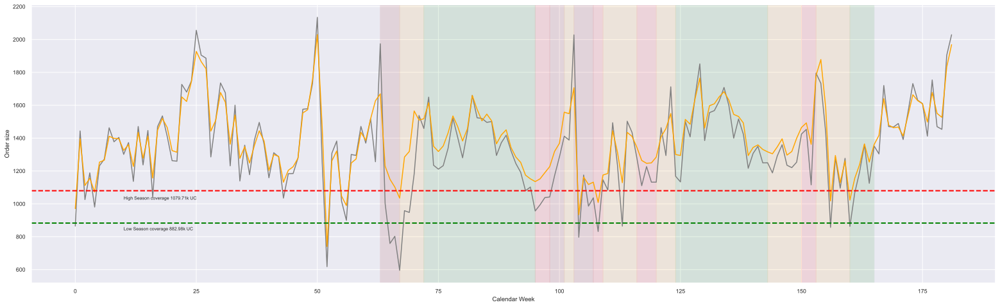

In [67]:
ax = X_weeks['UC'].plot(kind='line', figsize=(24,8), 
                                          color = ['gray'], 
                                          xlabel='Calendar Week', ylabel='Order size')
axx = X_weeks_reworked['UC'].plot(kind='line', figsize=(24,8), 
                                          color = ['orange'], 
                                          xlabel='Calendar Week', ylabel='Order size')

for i in range(len(Duration_lockdown4))[::2]:
    ax.axvspan(Duration_lockdown4[i], Duration_lockdown4[i+1]+1, 
           label="Hard Lockdown",color="darkred", alpha=0.1)

for i in range(len(Duration_lockdown3))[::2]:
    ax.axvspan(Duration_lockdown3[i], Duration_lockdown3[i+1]+1, 
           label="Light Lockdown",color="red", alpha=0.1)

for i in range(len(Duration_lockdown2))[::2]:
    ax.axvspan(Duration_lockdown2[i], Duration_lockdown2[i+1]+1, 
           label="Strict Measures",color="orange", alpha=0.1)

for i in range(len(Duration_lockdown1))[::2]:
    ax.axvspan(Duration_lockdown1[i], Duration_lockdown1[i+1]+1, 
           label="Light Measures",color="green", alpha=0.1)
    
plt.axhline(y=X_result['Low_season'].sum(), color='green', linestyle='--', linewidth = 2)
ax.text(10, X_result['Low_season'].sum()*0.95, f'Low Season coverage {X_result["Low_season"].sum():0.2f}k UC', size=7)
    
plt.axhline(y=X_result['High_season'].sum(), color='red', linestyle='--', linewidth = 2)
ax.text(10, X_result['High_season'].sum()*0.95, f'High Season coverage {X_result["High_season"].sum():0.2f}k UC', size=7)